In [2]:
import random
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# Camera calibration
### Correct for lens distortion using several calibration images

In [3]:
chessboard_images = glob.glob('./calibration_images/calibration*.jpg')
print('Number of Calibration Images: {}'.format(len(chessboard_images)))

Number of Calibration Images: 20


In [4]:
def get_mtx_and_dist(fnames, expected_corners=(9,6), show=True):
    """
    Given a list of filenames of chessboard calibration images and their expected corner shape,
    return the Camera calibration matrix and distortion coefficients.
    
    Note that this function has side effects in that the images processed will be displayed.
    """
    
    # Prepare object points as np.array like [[0, 0, 0], [1, 0, 0], ..., [8, 5, 0]] for a 9x6 chessboard
    objp = np.zeros((expected_corners[0] * expected_corners[1],3), np.float32)
    objp[...,:2] = np.mgrid[0:expected_corners[0],0:expected_corners[1]].T.reshape(-1, 2)
    
    objpoints = [] # real world 3d space
    imgpoints = [] # image plane 2d space
    not_calibrated = [] # list of images for which 9x6 corners were not detected
    
    for f in fnames:
        img = cv2.imread(f)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, expected_corners, None)
        if ret == True: # not all images will have 9x6 corners detected
            objpoints.append(objp) # same object points are used because all images should have 9x6 corners
            imgpoints.append(corners)
            
            if show:
                # display the detected chessboard corners on the input images
                annotated = cv2.drawChessboardCorners(img, expected_corners, corners, ret)            
                plt.figure(figsize=(16, 9))
                plt.title('Annotated: {}'.format(f))
                plt.imshow(annotated, aspect='auto')
            
        else:
            not_calibrated.append(f)
    
    if not_calibrated:
        print('Warning: could not detect 9x6 corners in the following images \n- {}'.format('\n- '.join(not_calibrated)))
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist

- ./calibration_images/calibration1.jpg
- ./calibration_images/calibration4.jpg
- ./calibration_images/calibration5.jpg


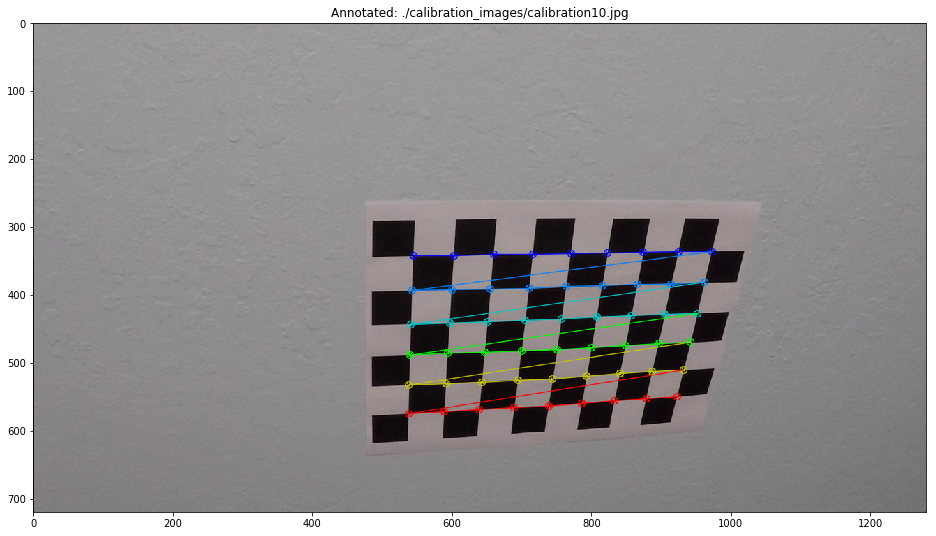

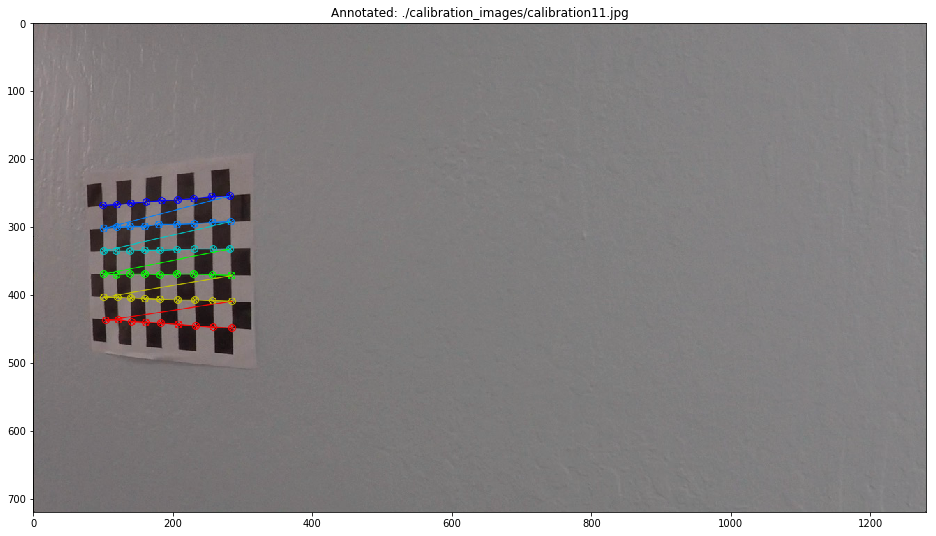

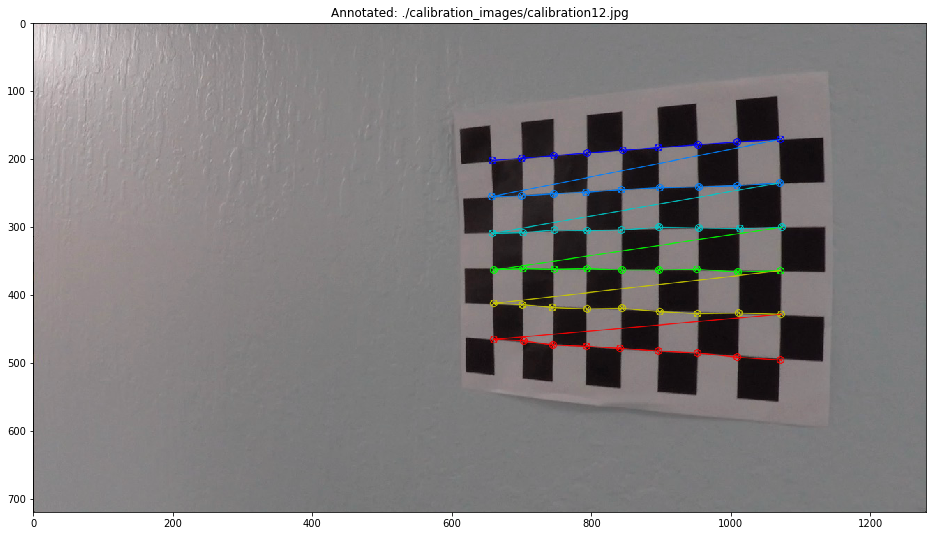

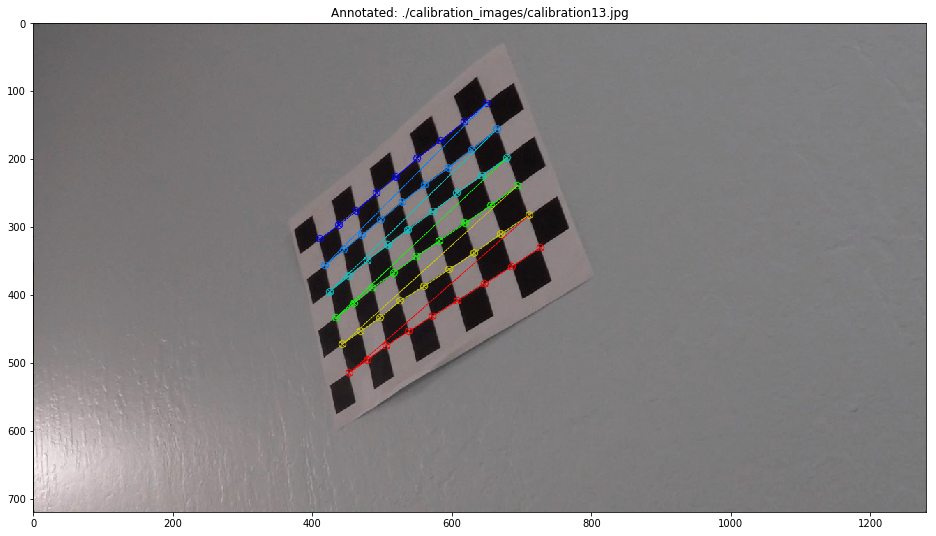

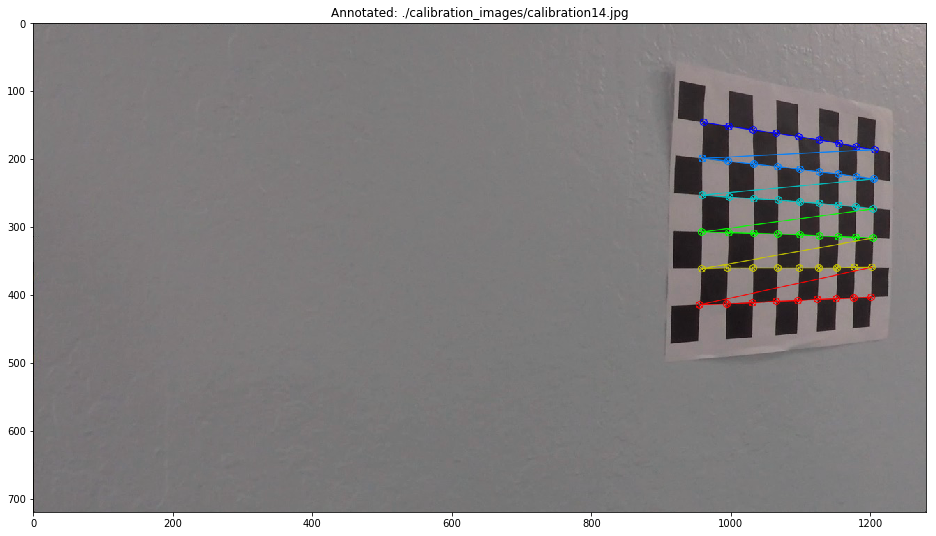

...

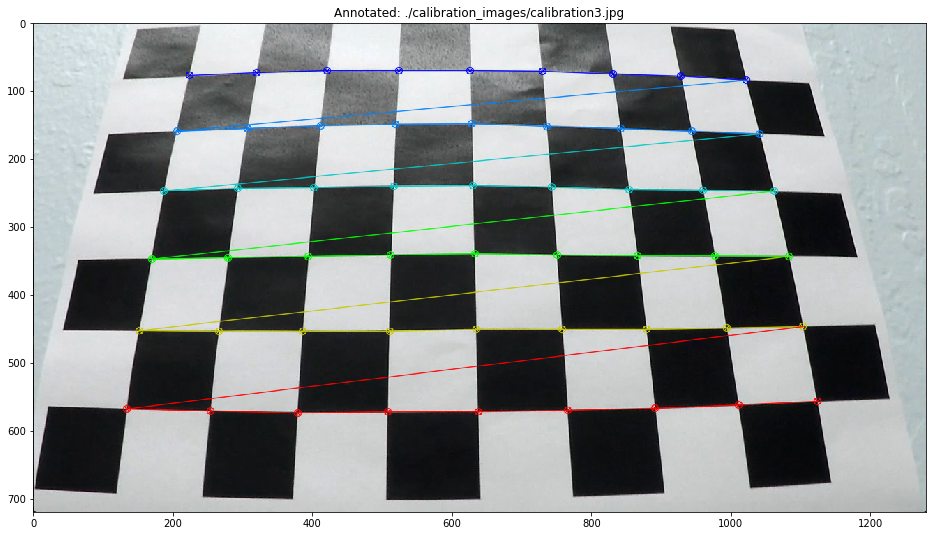

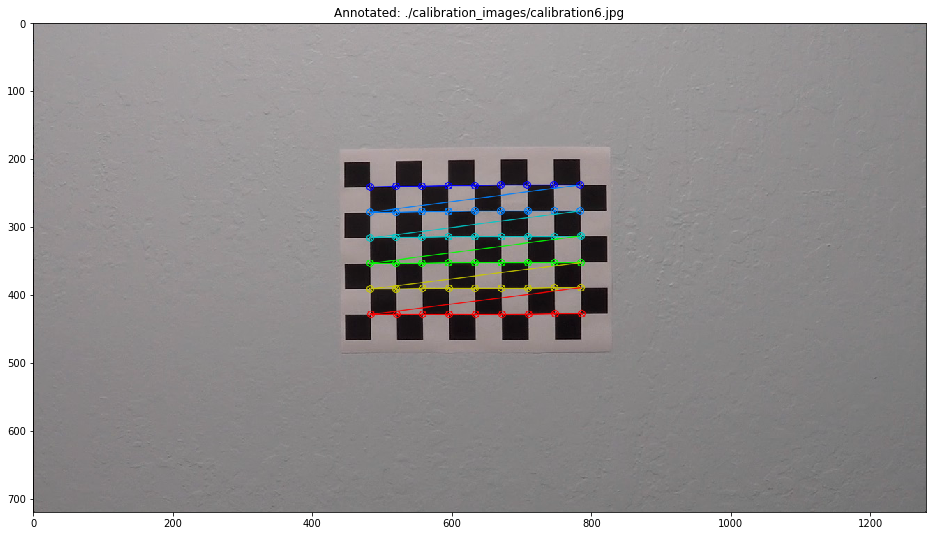

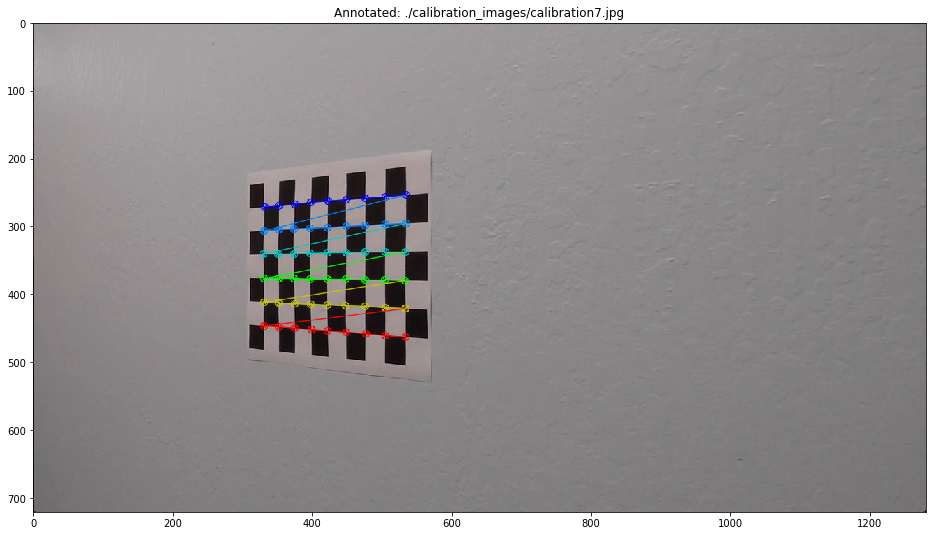

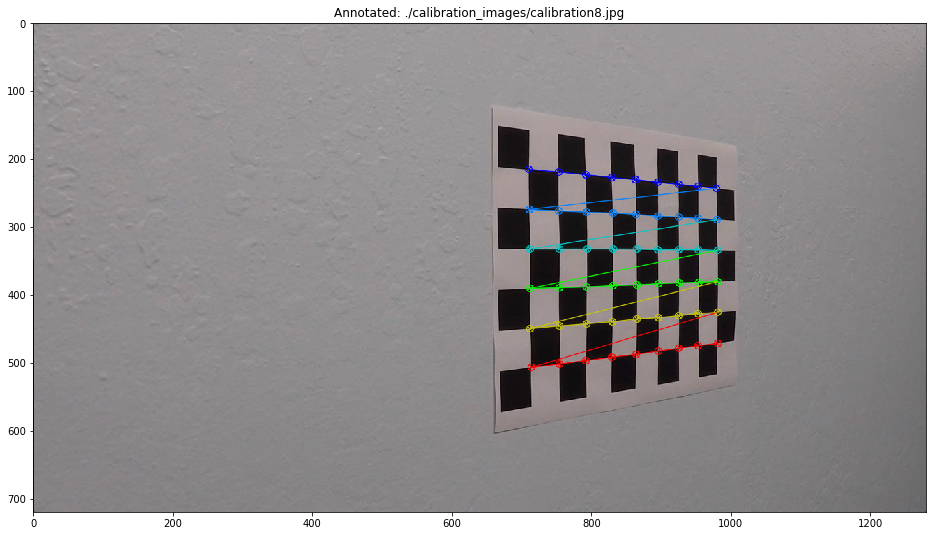

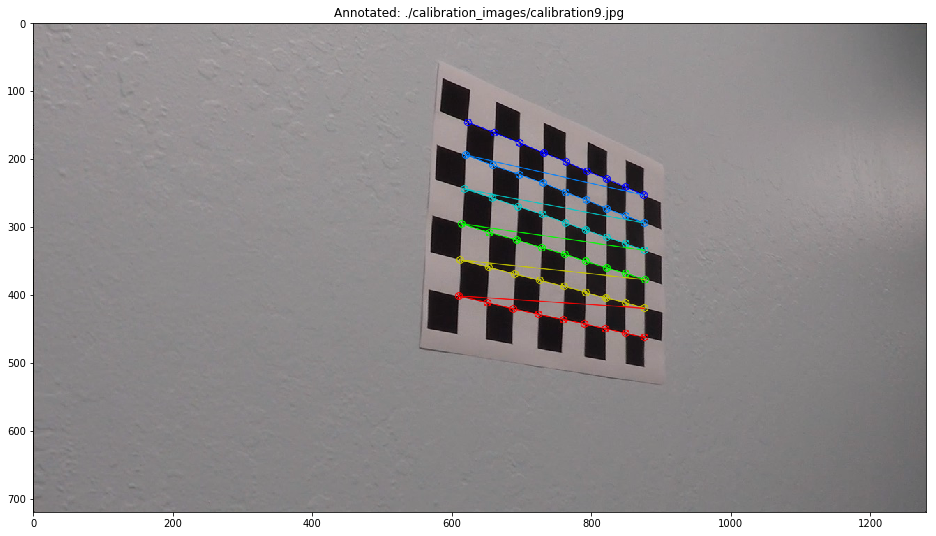

In [5]:
# get camera calibration matrix and distortion coefficients given a set of chessboard images
mtx, dist = get_mtx_and_dist(chessboard_images, show=True)

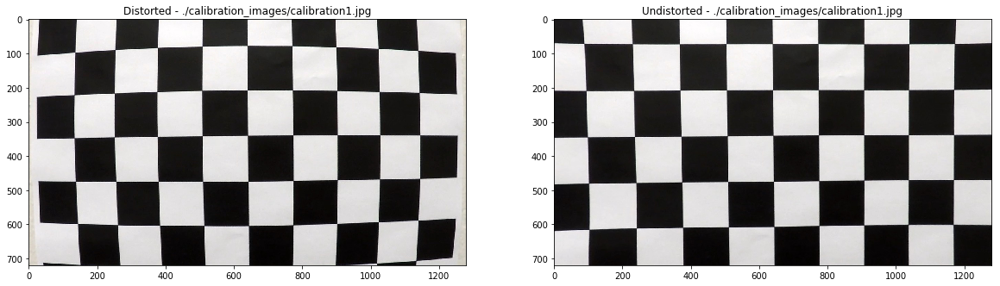

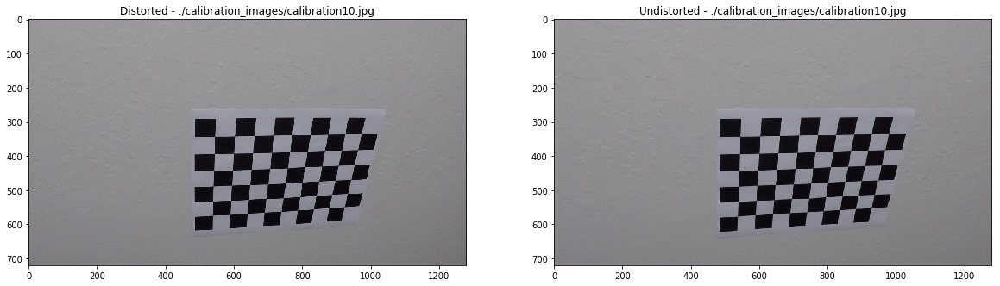

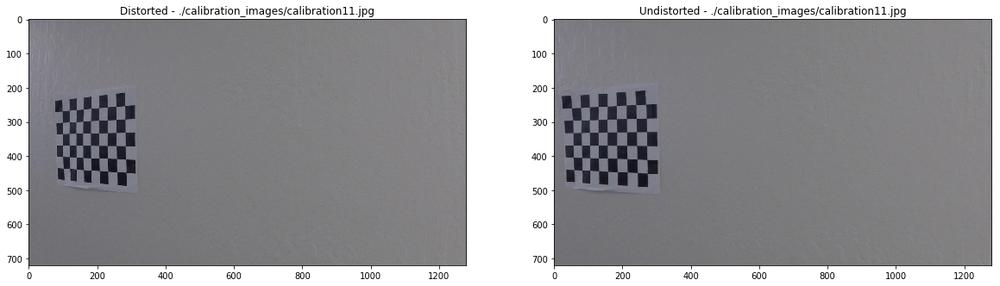

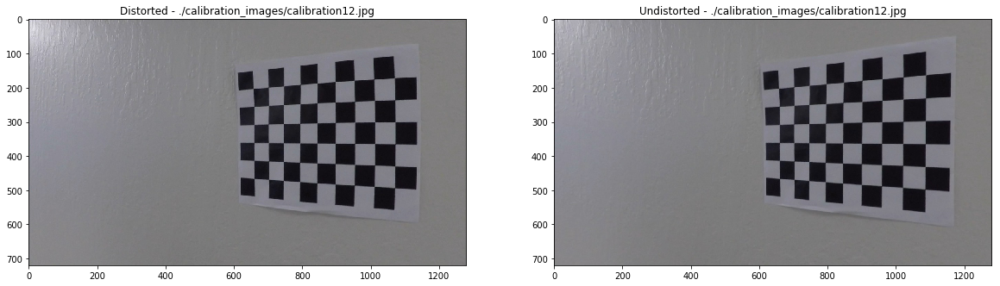

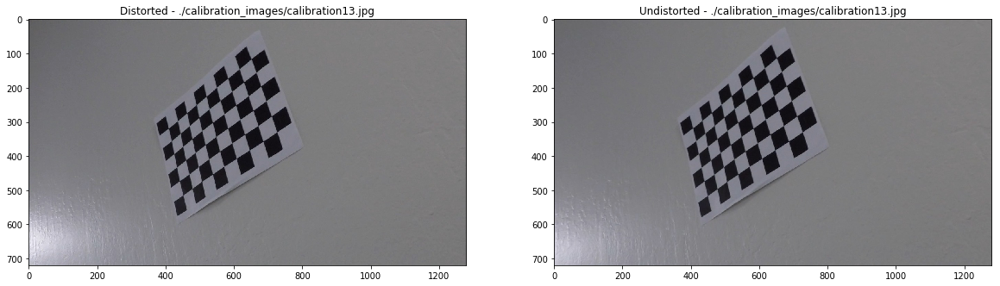

...

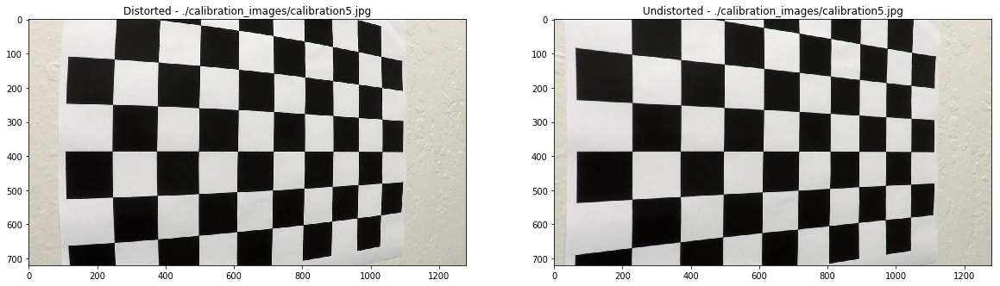

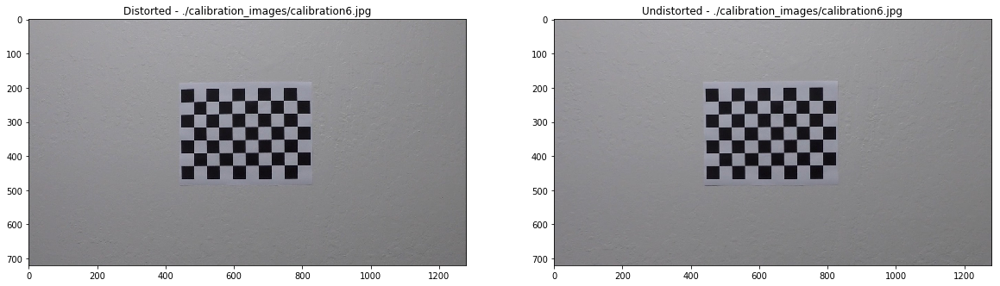

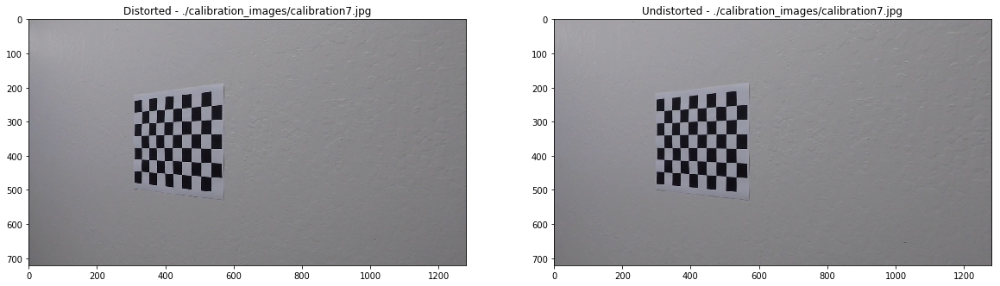

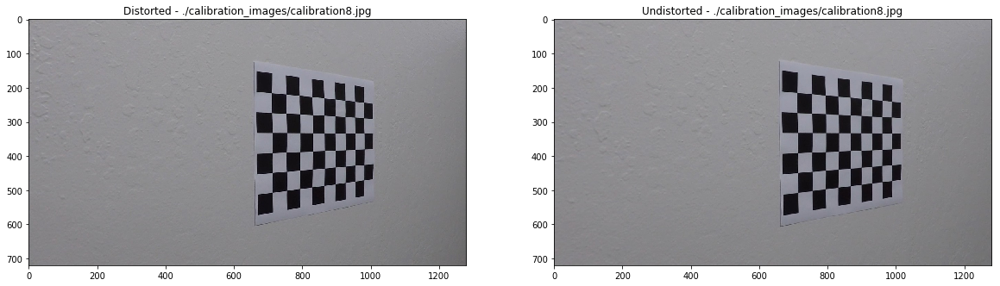

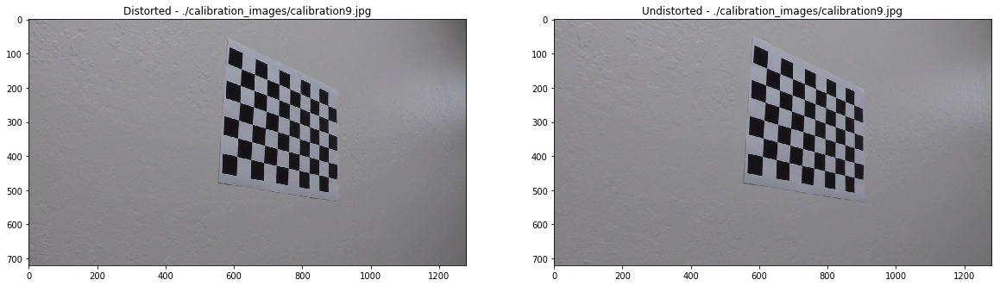

In [12]:
# visualize the distortion correction on each input chessboard image
for f in chessboard_images:
    distorted = cv2.cvtColor(cv2.imread(f), cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(distorted, mtx, dist, None, mtx)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Distorted - {}'.format(f))
    ax1.imshow(distorted)

    ax2.set_title('Undistorted - {}'.format(f))
    ax2.imshow(undistorted)

# Thresholded binary image
### Use color transforms and gradients to isolate the lane lines on an image

In [38]:
def apply_thresh(arr, thresh):
    binary = np.zeros_like(arr)
    binary[(arr >= thresh[0]) & (arr <= thresh[1])] = 1
    return binary

def absolute_sobel_gradient_threshold(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        raise ValueError("orient must be either 'x' or 'y'")
    
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    return apply_thresh(scaled_sobel, thresh)

def magnitude_gradient_threshold(img, sobel_kernel=3, thresh=(0, 255)):
    
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    
    magnitude = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled = np.uint8(255*magnitude/np.max(magnitude))
    
    return apply_thresh(scaled, thresh)

def gradient_direction_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    
    return apply_thresh(direction, thresh)

def threshold_image(img):
    hsl = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hsl[...,1]
    s_channel = hsl[...,2]

    # Sobel x threshold on the L channel
    sx_binary = absolute_sobel_gradient_threshold(l_channel, 
                                                  orient='x', 
                                                  thresh=(20, 100))

    # S channel threshold
    s_binary = apply_threshold(s_channel, (170, 255))

    combined_binary = np.zeros_like(sx_binary)
    combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
    
    return combined_binary

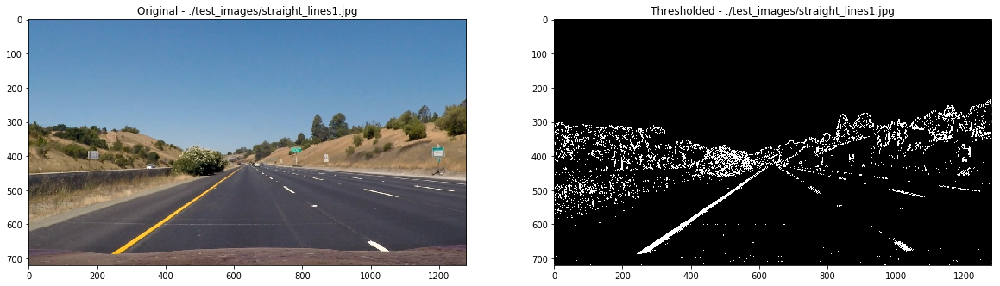

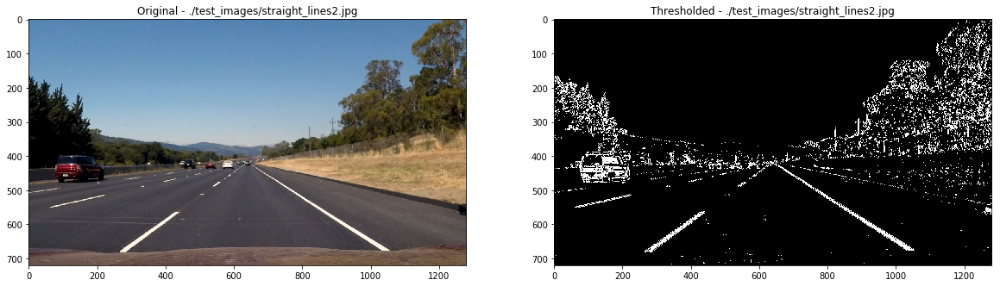

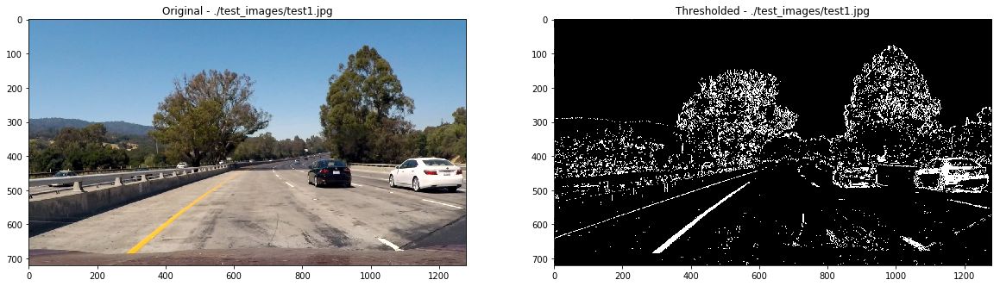

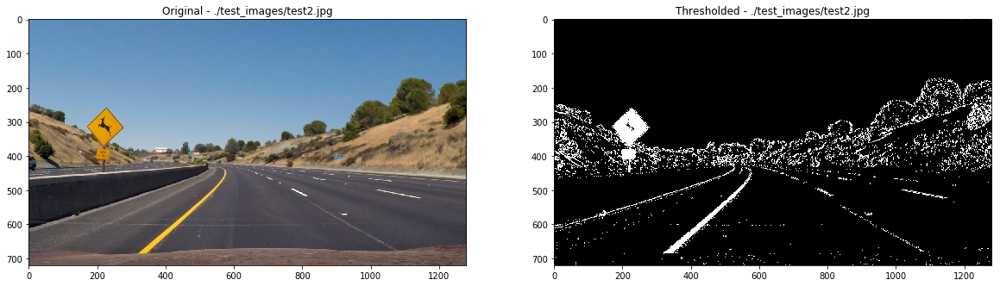

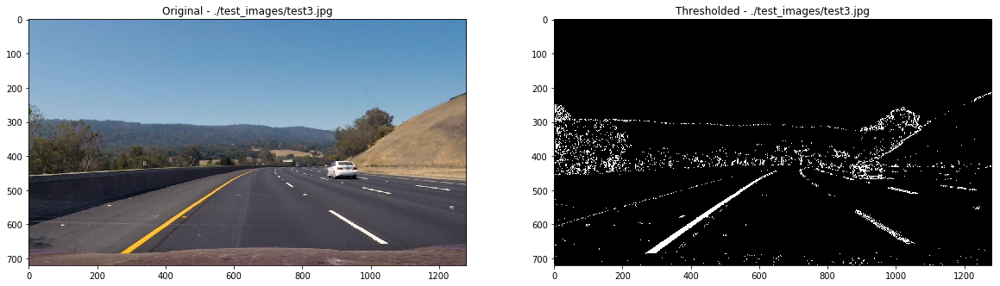

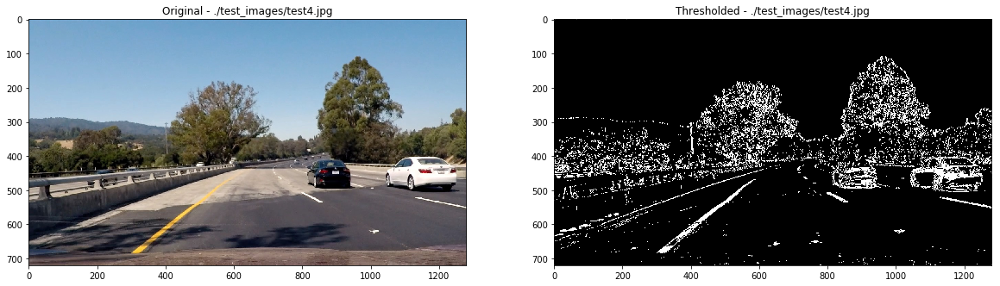

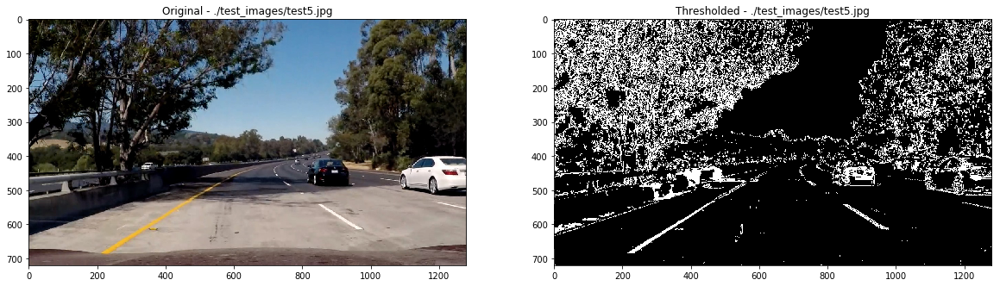

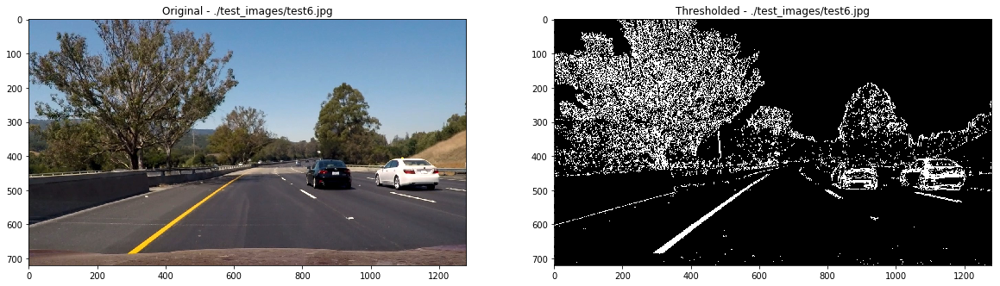

In [39]:
for f in glob.glob('./test_images/*.jpg'):
    img = cv2.imread(f)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original - {}'.format(f))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    res = threshold_image(img)
    ax2.set_title('Thresholded - {}'.format(f))
    ax2.imshow(res, cmap='gray')

In [ ]:
test